This code demonstrates two types of object recognition on panoramic images using PyTorch and Yolo that process the images a specific way and return varied results. In the beginning we will pre-process the images to see how variations in sizing, filtering, and warp will impact the results by both object recognition processes. 

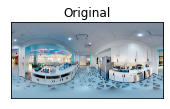

In [2]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
import time
from PIL import Image
import torch
import torchvision.models 
import torchvision.transforms as transforms    
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
import json
import imageio as im
from math import pi
import sys

#Smoothing Filter for the image to increase the processing speed of the images
img = cv2.imread('sample.jpeg')
kernel = np.ones((5,5),np.float32)/25
rows, cols, _channels = map(int, img.shape)
dst2 = cv2.pyrDown(img, dstsize=(cols // 2, rows // 2))
rows, cols, _channels = map(int, dst2.shape)
dst3 = cv2.pyrDown(dst2, dstsize=(cols // 2, rows // 2))
#cv2.imwrite('vertical_homography_attempt.jpg', dst3)
Image_Name= 'sample.jpeg'


#SMoothing will drastically increase processing speeds

#Sizing 
#
#warping prior to submission

plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
#plt.subplot(122),plt.imshow(dst),plt.title('Averaging')
plt.xticks([]), plt.yticks([])
plt.show()

In [3]:
class NFOV():
    def __init__(self, height=400, width=800):
        self.FOV = [0.45, 0.45]
        self.PI = pi
        self.PI_2 = pi * 0.5
        self.PI2 = pi * 2.0
        self.height = height
        self.width = width
        self.screen_points = self._get_screen_img()

    def _get_coord_rad(self, isCenterPt, center_point=None):
        return (center_point * 2 - 1) * np.array([self.PI, self.PI_2]) \
            if isCenterPt \
            else \
            (self.screen_points * 2 - 1) * np.array([self.PI, self.PI_2]) * (
                np.ones(self.screen_points.shape) * self.FOV)

    def _get_screen_img(self):
        xx, yy = np.meshgrid(np.linspace(0, 1, self.width), np.linspace(0, 1, self.height))
        return np.array([xx.ravel(), yy.ravel()]).T

    def _calcSphericaltoGnomonic(self, convertedScreenCoord):
        x = convertedScreenCoord.T[0]
        y = convertedScreenCoord.T[1]

        rou = np.sqrt(x ** 2 + y ** 2)
        c = np.arctan(rou)
        sin_c = np.sin(c)
        cos_c = np.cos(c)

        lat = np.arcsin(cos_c * np.sin(self.cp[1]) + (y * sin_c * np.cos(self.cp[1])) / rou)
        lon = self.cp[0] + np.arctan2(x * sin_c, rou * np.cos(self.cp[1]) * cos_c - y * np.sin(self.cp[1]) * sin_c)

        lat = (lat / self.PI_2 + 1.) * 0.5
        lon = (lon / self.PI + 1.) * 0.5

        return np.array([lon, lat]).T

    def _bilinear_interpolation(self, screen_coord):
        uf = np.mod(screen_coord.T[0],1) * self.frame_width  # long - width
        vf = np.mod(screen_coord.T[1],1) * self.frame_height  # lat - height

        x0 = np.floor(uf).astype(int)  # coord of pixel to bottom left
        y0 = np.floor(vf).astype(int)
        x2 = np.add(x0, np.ones(uf.shape).astype(int))  # coords of pixel to top right
        y2 = np.add(y0, np.ones(vf.shape).astype(int))

        base_y0 = np.multiply(y0, self.frame_width)
        base_y2 = np.multiply(y2, self.frame_width)

        A_idx = np.add(base_y0, x0)
        B_idx = np.add(base_y2, x0)
        C_idx = np.add(base_y0, x2)
        D_idx = np.add(base_y2, x2)

        flat_img = np.reshape(self.frame, [-1, self.frame_channel])

        A = np.take(flat_img, A_idx, axis=0)
        B = np.take(flat_img, B_idx, axis=0)
        C = np.take(flat_img, C_idx, axis=0)
        D = np.take(flat_img, D_idx, axis=0)

        wa = np.multiply(x2 - uf, y2 - vf)
        wb = np.multiply(x2 - uf, vf - y0)
        wc = np.multiply(uf - x0, y2 - vf)
        wd = np.multiply(uf - x0, vf - y0)

        # interpolate
        AA = np.multiply(A, np.array([wa, wa, wa]).T)
        BB = np.multiply(B, np.array([wb, wb, wb]).T)
        CC = np.multiply(C, np.array([wc, wc, wc]).T)
        DD = np.multiply(D, np.array([wd, wd, wd]).T)
        nfov = np.reshape(np.round(AA + BB + CC + DD).astype(np.uint8), [self.height, self.width, 3])
        import matplotlib.pyplot as plt
        #plt.imshow(nfov)
        #plt.show()
        return nfov

    def toNFOV(self, frame, center_point):
        self.frame = frame
        self.frame_height = frame.shape[0]
        self.frame_width = frame.shape[1]
        self.frame_channel = frame.shape[2]

        self.cp = self._get_coord_rad(center_point=center_point, isCenterPt=True)
        convertedScreenCoord = self._get_coord_rad(isCenterPt=False)
        spericalCoord = self._calcSphericaltoGnomonic(convertedScreenCoord)
        return self._bilinear_interpolation(spericalCoord)

In [23]:
def recognize_objects(filename):
  start = time.time()
  #Reference for built in object detection model:https://pytorch.org/docs/stable/torchvision/models.html
  model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
  transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))])
  model.eval()
  filePath = "objLabels.json"
  file = open(filePath,'r')  #reformatted from MSCOCO 2017 annotations
  data = json.load(file)
  file.close()
  imgName = filename
  imgPath = ""
  img = Image.open(imgPath + imgName)
  width, height = img.size
  imgTrans = transforms.ToTensor()
  x = [imgTrans(img)]
  predictions = model(x)
  #print(predictions)
  labelPred = predictions[0]['labels']
  file1Path = "imgObjs.json"
  file1 = open(file1Path,'r')  #reformatted from MSCOCO 2017 annotations
  objDict = json.load(file1)
  file1.close()
  scoresPred = predictions[0]['scores']
  # arr is formated xMin, yMin, xMax, yMax
  # Reference: https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html
  boxPred = predictions[0]['boxes']
  boxObjs = []
  fig = plt.figure(figsize=(width/100,height/100))
  axis = fig.add_axes([0, 0, 1, 1])
  axis.imshow(img)
  objLst = []
  total_accuracy=0
  num_objects=0
  for i in range(len(boxPred)):
      predData = boxPred[i].detach().numpy()
      labelKey = str(int(labelPred[i].detach().numpy()))
      labelVal = data[labelKey]
      confidence = scoresPred[i].detach().numpy()
      confidenceLvl = 0.20
      objClass = "knife"
      if confidence >= confidenceLvl:
          #UNCOMMENT BELOW & FIX INDENT TO VIEW IMAGE WITH BOUNDING BOXES FOR ONLY A SPECIFIC CLASS
          #if labelVal==objClass:
              if not labelVal in objLst:
                  objLst.append(labelVal)
              #generates the image, saving must be done manually
              width = predData[2]-predData[0]
              height = predData[3]-predData[1]
              axis.add_patch(Rectangle([predData[0],predData[1]],width,height,edgecolor='r',facecolor='none'))
              #Reference for drawing text: https://matplotlib.org/3.3.3/api/_as_gen/matplotlib.pyplot.text.html
              plt.text(predData[0],predData[1],(labelVal+": "+str(confidence)),bbox=dict(facecolor='white', alpha=0.5))
              total_accuracy=total_accuracy+confidence
              num_objects=num_objects+1
  end = time.time()
  print("Elapsed (with compilation) = %s" % (end - start))
  print("Number of Objects: "+str(num_objects))
  if (num_objects!=0):
    print("Average Accuracy: "+str(total_accuracy/num_objects))
  plt.axis('off')
  plt.show()

  #saves oject classes contained in the generated image to a file
  objDict[imgName] = objLst
  output2 = open(file1Path,'w')
  json.dump(objDict,output2)
  output2.close()

Elapsed (with compilation) = 8.691463708877563
Number of Objects: 0


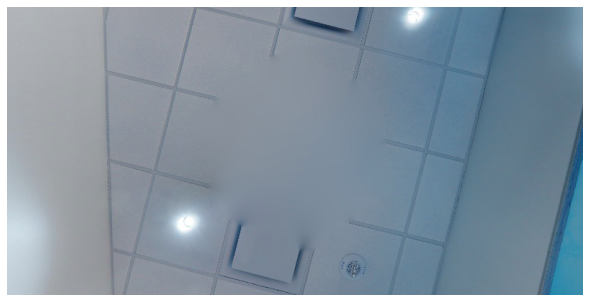

Elapsed (with compilation) = 9.596059322357178
Number of Objects: 3
Average Accuracy: 0.26132166385650635


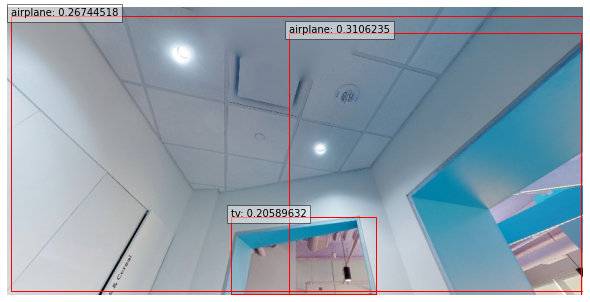

Elapsed (with compilation) = 13.425485372543335
Number of Objects: 33
Average Accuracy: 0.5322815206917849


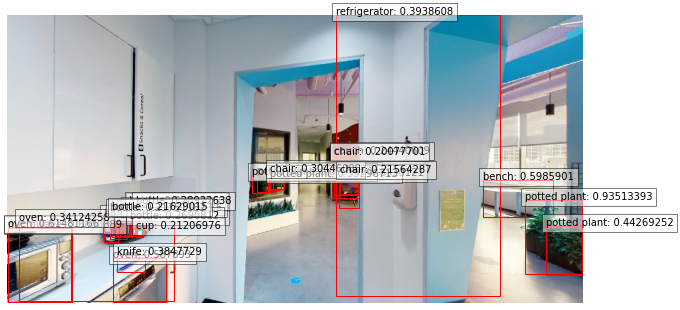

Elapsed (with compilation) = 8.493604183197021
Number of Objects: 15
Average Accuracy: 0.42426406443119047


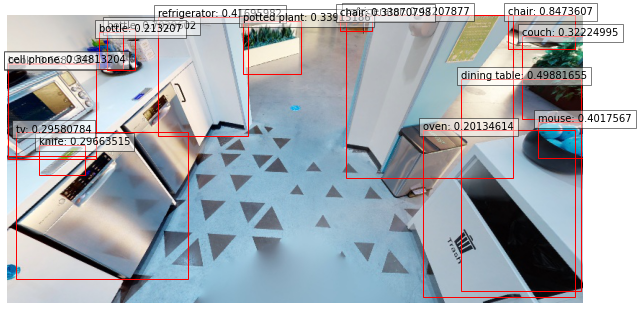

Elapsed (with compilation) = 8.34554386138916
Number of Objects: 0


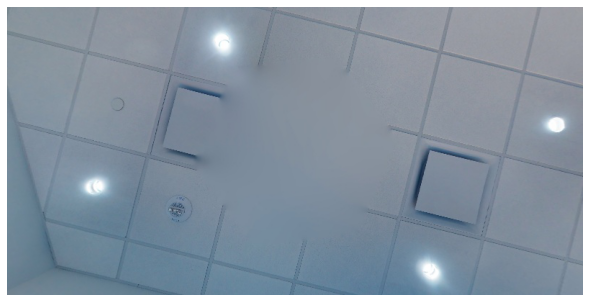

Elapsed (with compilation) = 8.387855052947998
Number of Objects: 6
Average Accuracy: 0.4241263543566068


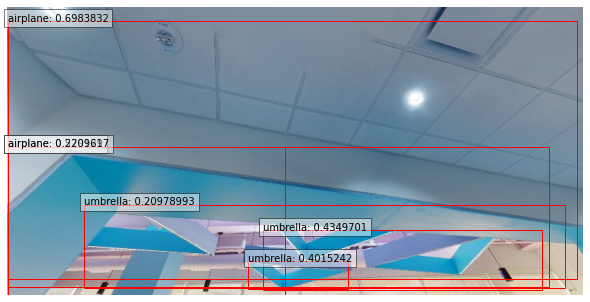

Elapsed (with compilation) = 8.243866920471191
Number of Objects: 25
Average Accuracy: 0.4600501984357834


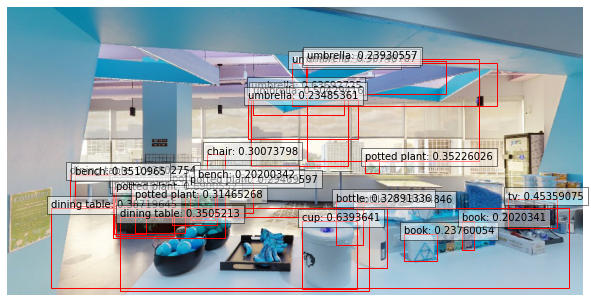

Elapsed (with compilation) = 8.327971935272217
Number of Objects: 14
Average Accuracy: 0.4873633618865694


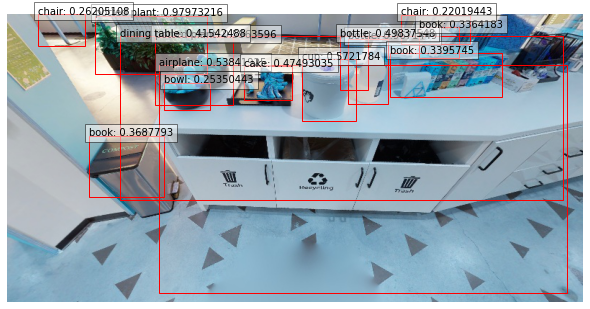

Elapsed (with compilation) = 8.361412048339844
Number of Objects: 1
Average Accuracy: 0.2799316942691803


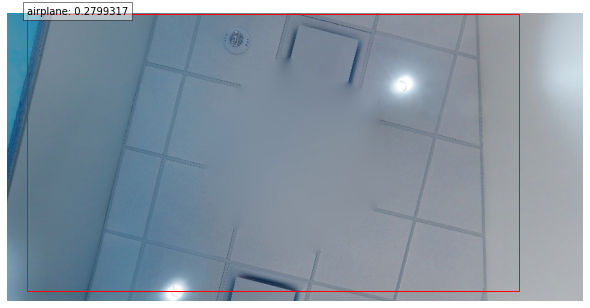

Elapsed (with compilation) = 8.132954120635986
Number of Objects: 5
Average Accuracy: 0.3017953336238861


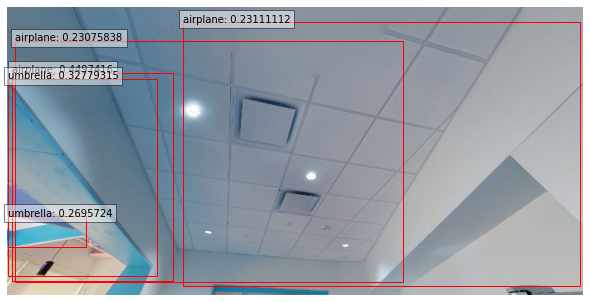

Elapsed (with compilation) = 8.39536452293396
Number of Objects: 21
Average Accuracy: 0.3819261228754407


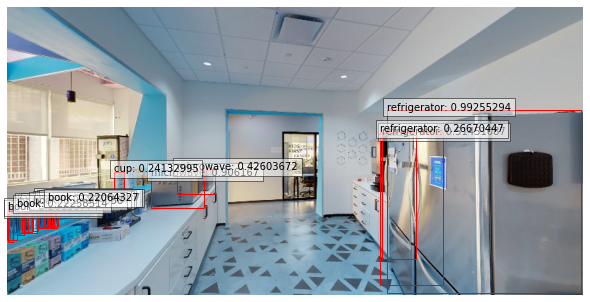

Elapsed (with compilation) = 8.287909030914307
Number of Objects: 8
Average Accuracy: 0.36768579110503197


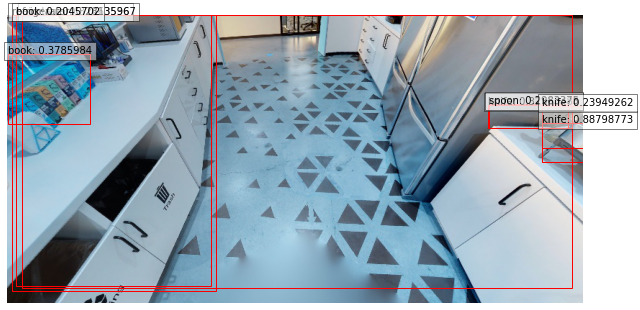

Elapsed (with compilation) = 8.358733892440796
Number of Objects: 0


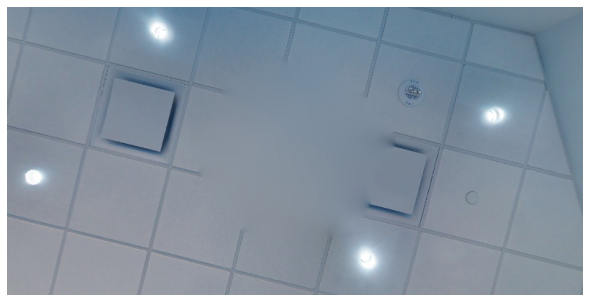

Elapsed (with compilation) = 8.022266864776611
Number of Objects: 0


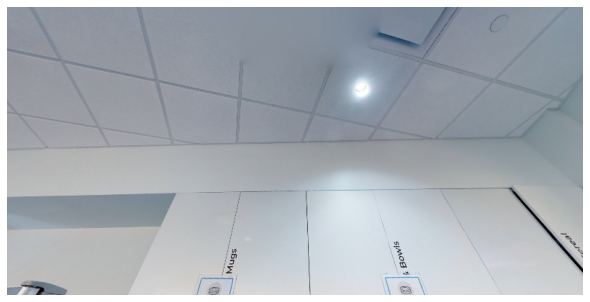

Elapsed (with compilation) = 8.256125688552856
Number of Objects: 29
Average Accuracy: 0.45784831920574454


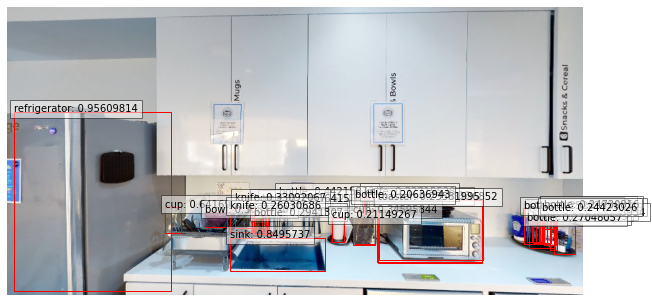

Elapsed (with compilation) = 8.308063268661499
Number of Objects: 13
Average Accuracy: 0.44765073977983916


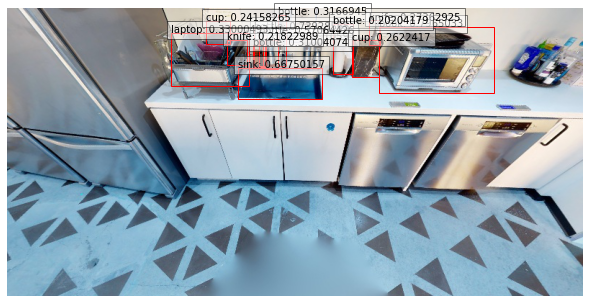

finished


In [24]:
img = im.imread('sample.jpeg')
nfov = NFOV()

for i in range (0,4):
  for j in range (0,4):
    center_point = np.array([(i/4), (j/4)])  # camera center point (valid range [0,1])
    fovimg=nfov.toNFOV(img, center_point)
    filename=('image at '+str(i)+', '+str(j)+'10.jpg')
    cv2.imwrite(filename, fovimg)
    recognize_objects(filename)
print("finished")

#stitch all the images back together. 


The following code was created by Lauren Olson and Sury in Fall 2020 for the purpose of processing images (in this case, panoramas) and performing object detection using the COCO dataset and pytorch. we have improved the filter for confidence and the accuracy of the bounding boxes. 

Elapsed (with compilation) = 8.64152216911316
Number of Objects: 30
Average Accuracy: 0.4525824382901192


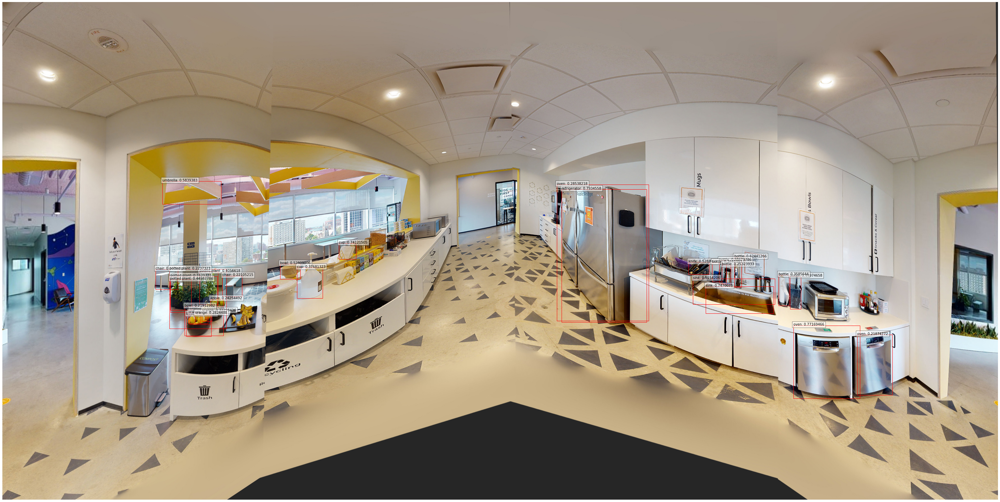

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Sun Nov 22 12:35:32 2020
@author: Lauren and Sury, edited by Marc and Sury 5/29/21
"""
from PIL import Image
import torch
import torchvision.models 
import torchvision.transforms as transforms    
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
from matplotlib.patches import Rectangle
import json

start = time.time()
#Reference for built in object detection model:https://pytorch.org/docs/stable/torchvision/models.html
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
transform = transforms.Compose([transforms.ToTensor(),transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))])
model.eval()
filePath = "objLabels.json"
file = open(filePath,'r')  #reformatted from MSCOCO 2017 annotations
data = json.load(file)
file.close()
imgName = Image_Name
imgPath = ""
img = Image.open(imgPath + imgName)
width, height = img.size
imgTrans = transforms.ToTensor()
x = [imgTrans(img)]
predictions = model(x)
#print(predictions)
labelPred = predictions[0]['labels']
file1Path = "imgObjs.json"
file1 = open(file1Path,'r')  #reformatted from MSCOCO 2017 annotations
objDict = json.load(file1)
file1.close()
scoresPred = predictions[0]['scores']
# arr is formated xMin, yMin, xMax, yMax
# Reference: https://pytorch.org/tutorials/intermediate/torchvision_tutorial.html
boxPred = predictions[0]['boxes']
boxObjs = []
fig = plt.figure(figsize=(width/100,height/100))
axis = fig.add_axes([0, 0, 1, 1])
axis.imshow(img)
objLst = []
total_accuracy=0
num_objects=0
for i in range(len(boxPred)):
    predData = boxPred[i].detach().numpy()
    labelKey = str(int(labelPred[i].detach().numpy()))
    labelVal = data[labelKey]
    confidence = scoresPred[i].detach().numpy()
    confidenceLvl = 0.20
    objClass = "knife"
    if confidence >= confidenceLvl:
        #UNCOMMENT BELOW & FIX INDENT TO VIEW IMAGE WITH BOUNDING BOXES FOR ONLY A SPECIFIC CLASS
        #if labelVal==objClass:
            if not labelVal in objLst:
                objLst.append(labelVal)
            #generates the image, saving must be done manually
            width = predData[2]-predData[0]
            height = predData[3]-predData[1]
            axis.add_patch(Rectangle([predData[0],predData[1]],width,height,edgecolor='r',facecolor='none'))
            #Reference for drawing text: https://matplotlib.org/3.3.3/api/_as_gen/matplotlib.pyplot.text.html
            plt.text(predData[0],predData[1],(labelVal+": "+str(confidence)),bbox=dict(facecolor='white', alpha=0.5))
            total_accuracy=total_accuracy+confidence
            num_objects=num_objects+1
end = time.time()
print("Elapsed (with compilation) = %s" % (end - start))
print("Number of Objects: "+str(num_objects))
print("Average Accuracy: "+str(total_accuracy/num_objects))
plt.axis('off')
plt.show()
#saves oject classes contained in the generated image to a file
objDict[imgName] = objLst
output2 = open(file1Path,'w')
json.dump(objDict,output2)
output2.close()

This code also does object detection, based off of the work by Wenyan Yang, et al, at Cornell University. (https://arxiv.org/abs/1805.08009) This code assists the object recognition (using Yolo) by splitting the image and warping it through stereographic projection. We adjusted this code to better accommodate the code for the particular images that we use pertaining to wider images and adjusting it to run sementally. We have also implemented numba to improve the speed of processing for specific sections. 

In [5]:
import argparse
from math import pi, atan, cos, sin, acos, sqrt, tan
import sys
from scipy.interpolate import RectBivariateSpline
import numpy as np
import cv2

In [6]:
def projection_angle(x, d):
    """
    The function is the inversion of eq(1)in W. Yang's m-p YOLO paper.
    In the case of d=1:
    phi = atan(4*xp/(4-xp**2)) if xp != xp_max else np.pi/2
    theta = atan(4*yp/(4-yp**2)) if yp != yp_max else np.pi/2
    Args:
        x: the symbol xp or yp in eq(1) of W. Yang's m-p YOLO paper.
        d: the de-center from the center of a sphere in W. Yang's m-p YOLO paper.
    Return:
        project_angle: theta or phi in eq(1) of W. Yang's m-p YOLO paper.
    """
    x_max = (1 + d) / d
    numerator = -2 * d * x ** 2 + 2 * (d + 1) * sqrt((1 - d ** 2) * x ** 2 + (d + 1) ** 2)
    denominator = 2 * (x ** 2 + (d + 1) ** 2)
    if 0 < x < x_max:
        project_angle = acos(numerator / denominator)
    elif x < 0:
        project_angle = - acos(numerator / denominator)
    elif x == x_max:
        project_angle = pi/2.
    else:
        raise Exception('invalid input args')
    return project_angle

In [7]:
def pano2stereo(pic, distance=1.):
    '''
    The main function for panorama picture transfrom to stereo projection,
    and save the transformed pic as 'face_0.jpg', 'face_1.jpg', 'face_2.jpg', 'face_3.jpg'.
    Each pic represents different projection face.
    Args:
        pic: input panorama picture
    '''
    frames = []
    input_img = pic
    height, width, _ = input_img.shape
    d = distance
    xp_max = (1 + d) / d  # in the case of d=1, it is 2
    yp_max = (1 + d) / d  # in the case of d=1, it is 2
    xp_domain = xp_max * (np.arange(-1., 1., 2. / height) + 1.0 / height)
    yp_domain = yp_max * (np.arange(-1., 1., 2. / height) + 1.0 / height)
    delta_rad = 2 * pi / width  # get the rads of each pixel

    for face in range(4):
        print('generating face', face)
        output_img = np.zeros((height, height, 3))
        # interpolate function for each channel which is provided by scipy
        interpolate_0 = RectBivariateSpline(np.arange(height), np.arange(width), input_img[:, :, 0])
        interpolate_1 = RectBivariateSpline(np.arange(height), np.arange(width), input_img[:, :, 1])
        interpolate_2 = RectBivariateSpline(np.arange(height), np.arange(width), input_img[:, :, 2])
        pano_x = np.zeros((height, 1))
        pano_y = np.zeros((height, 1))

        # longitude (phi) and latitude (theta) is the angular information from center of the sphere
        for j, xp in enumerate(xp_domain):
            phi = projection_angle(xp, d)
            pano_x[j] = (width / 2.0 + (phi / delta_rad))

        for i, yp in enumerate(yp_domain):
            theta = projection_angle(yp, d)
            pano_y[i] = height/2.0 + (theta/delta_rad)

        output_img[:, :, 0] = interpolate_0(pano_y, pano_x)
        output_img[:, :, 1] = interpolate_1(pano_y, pano_x)
        output_img[:, :, 2] = interpolate_2(pano_y, pano_x)

        cv2.imwrite('face_'+str(face)+'_'+str(d)+'.jpg', output_img)
        frames.append(output_img)
        # change the projection face for the origin panorama
        input_img = np.concatenate(
            (input_img[:, int(width/4):, :], input_img[:, :int(width/4), :]), axis=1)
    return frames

def stereo2pano(in_pic):
    '''
    Stereo Projection picture to transform back to panorama
    Args:
        in_pic: the stereo pic you want to transform
    
    Return:
        output_img(np.array): the pano image
    '''
    input_img = in_pic
    d = 1.
    height = input_img.shape[0]
    width = input_img.shape[1]
    output_img = np.zeros((height, height, 3))

    xp_domain = np.arange(-pi/2., pi/2., pi/height) + pi/height
    yp_domain = np.arange(-pi/2., pi/2., pi/height) + pi/height

    # interpolate function for each channel which is provided by scipy
    interpolate_0 = RectBivariateSpline(np.arange(height), np.arange(width), input_img[:, :, 0])
    interpolate_1 = RectBivariateSpline(np.arange(height), np.arange(width), input_img[:, :, 1])
    interpolate_2 = RectBivariateSpline(np.arange(height), np.arange(width), input_img[:, :, 2])

    for j, phi in enumerate(xp_domain):
        for i, theta in enumerate(yp_domain):

            stereo_x = 2*sin(phi)/(1+cos(phi)) * width/4 + width/2
            stereo_y = 2*sin(theta)/(1+cos(theta)) * height/4 + height/2

            output_img[i, j, 0] = interpolate_0([stereo_y], [stereo_x])
            output_img[i, j, 1] = interpolate_1([stereo_y], [stereo_x])
            output_img[i, j, 2] = interpolate_2([stereo_y], [stereo_x])

    return output_img

def realign_bbox(center_x, center_y, width, height, face):
    if face == 3:
        face = -1
    def safe_atan(x):
        if x == 2: return pi/2
        elif x == -2: return -pi/2
        else: return atan(4*x/(4-x**2))

    xp = 4*(center_x-0.5)
    phi = safe_atan(xp)
    phi = phi + face*pi/2
    if phi > 2*pi:
        phi = phi-4*pi
    center_phi = phi/(2*pi)+0.5
    
    yp = 4*(center_y-0.5)
    theta = safe_atan(yp)
    center_theta = theta/pi+0.5
    
    def realign_border(center, line):
        vertex_1 = 4*(center-0.5-line/2)
        vertex_2 = 4*(center-0.5+line/2)
        angle_1 = safe_atan(vertex_1)
        angle_2 = safe_atan(vertex_2)
        return np.absolute(angle_2-angle_1)

    pano_width = realign_border(center_x, width)/(2*pi)
    pano_height = realign_border(center_y, height)/pi

    return center_phi, center_theta, pano_width, pano_height

def merge_stereo(stereos):
    print('Merging the projected pictures back...')
    frame_0 = stereo2pano(stereos[0]) # from -pi/2 ~pi/2
    print('====First  Picture====')
    frame_1 = stereo2pano(stereos[1]) # from 0 ~ pi
    print('====Second Picture====')
    frame_2 = stereo2pano(stereos[2]) # from pi/2 ~ pi and -pi ~ -pi/2
    print('====Third  Picture====')
    frame_3 = stereo2pano(stereos[3]) # from -pi/2 ~ 0
    print('====Forth  Picture====')
    stride = int(frame_2.shape[1]/2)
    
    pano_1 = np.concatenate([frame_3, frame_1], axis=1)
    pano_2 = np.concatenate([frame_2[:, stride:, :], frame_0, frame_2[:, :stride, :]], axis=1)

    cv2.imwrite('./merge_pano.jpg', (pano_1 + pano_2)/2)

    return (pano_1 + pano_2)/2


In [8]:
CF_THRESHOLD = 0.2
NMS_THRESHOLD = 0.4
INPUT_RESOLUTION = (416, 416)

In [9]:
class Yolo():
    '''
    Packed yolo Netwrok from cv2
    '''
    def __init__(self):
        # get model configuration and weight
        model_configuration = 'yolov3.cfg'
        model_weight = 'yolov3.weights'

        # define classes
        self.classes = None
        class_file = 'coco.names'
        with open(class_file, 'rt') as file:
            self.classes = file.read().rstrip('\n').split('\n')

        net = cv2.dnn.readNetFromDarknet(
            model_configuration, model_weight)
        net.setPreferableBackend(cv2.dnn.DNN_BACKEND_OPENCV)
        net.setPreferableTarget(cv2.dnn.DNN_TARGET_CPU)
        self.yolo = net

        self.cf_th = CF_THRESHOLD
        self.nms_th = NMS_THRESHOLD
        self.resolution = INPUT_RESOLUTION
        print('Model Initialization Done!')

    def detect(self, frame):
        '''
        The yolo function which is provided by opencv
        Args:
            frames(np.array): input picture for object detection
        Returns:
            ret(np.array): all possible boxes with dim = (N, classes+5)
        '''
        blob = cv2.dnn.blobFromImage(np.float32(frame), 1/255, self.resolution,
                                     [0, 0, 0], 1, crop=False)

        self.yolo.setInput(blob)
        layers_names = self.yolo.getLayerNames()
        output_layer =\
            [layers_names[i[0] - 1] for i in self.yolo.getUnconnectedOutLayers()]
        outputs = self.yolo.forward(output_layer)

        ret = np.zeros((1, len(self.classes)+5))
        for out in outputs:
            ret = np.concatenate((ret, out), axis=0)
        return ret

    def draw_bbox(self, frame, class_id, conf, left, top, right, bottom):
        '''
        Drew a Bounding Box
        Args:
            frame(np.array): the base image for painting box on
            class_id(int)  : id of the object
            conf(float)    : confidential score for the object
            left(int)      : the left pixel for the box
            top(int)       : the top pixel for the box
            right(int)     : the right pixel for the box
            bottom(int)    : the bottom pixel for the box
        Return:
            frame(np.array): the image with bounding box on it
        '''
        # Draw a bounding box.
        cv2.rectangle(frame, (left, top), (right, bottom), (255, 178, 50), 3)

        label = '%.2f' % conf

        # Get the label for the class name and its confidence
        if self.classes:
            assert(class_id < len(self.classes))
            label = '%s:%s' % (self.classes[class_id], label)

        #Display the label at the top of the bounding box
        label_size, base_line = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 2, 1)
        top = max(top, label_size[1])
        cv2.rectangle(frame,
                      (left, top - round(1*label_size[1])),
                      (left + round(label_size[0]), top + base_line),
                      (255, 255, 255), cv2.FILLED)
        cv2.putText(frame, label, (left, top), cv2.FONT_HERSHEY_SIMPLEX, 2, (0, 0, 0), 2)
        return frame

    def nms_selection(self, frame, output):

        print('NMS selecting...')
        frame_height = frame.shape[0]
        frame_width = frame.shape[1]

        # Scan through all the bounding boxes output from the network and keep only the
        # ones with high confidence scores. Assign the box's class label as the class
        # with the highest score.
        class_ids = []
        confidences = []
        boxes = []
        for detection in output:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > CF_THRESHOLD:
                center_x = int(detection[0] * frame_width)
                center_y = int(detection[1] * frame_height)
                width = int(detection[2] * frame_width)
                height = int(detection[3] * frame_height)
                left = int(center_x - width / 2)
                top = int(center_y - height / 2)
                class_ids.append(class_id)
                confidences.append(float(confidence))
                boxes.append([left, top, width, height])

        # Perform non maximum suppression to eliminate redundant overlapping boxes with
        # lower confidences.
        indices = cv2.dnn.NMSBoxes(boxes, confidences, CF_THRESHOLD, NMS_THRESHOLD)

        return class_ids, confidences, boxes, indices

    def process_output(self, input_img, frames):
        '''
        Main progress in the class.
        Detecting the pics >> Calculate Re-align BBox >> NMS selection >> Draw BBox
        Args:
            input_img(np.array): the original pano image
            frames(list)       : the results from pan2stereo, the list contain four spects of view
        Returns:
            base_frame(np.array): the input pano image with BBoxes
        '''
        height = frames[0].shape[0]
        width = frames[0].shape[1]
        first_flag = True
        outputs = None

        print('Yolo Detecting...')
        for face, frame in enumerate(frames):
            output = self.detect(frame)
            for i in range(output.shape[0]):
                output[i, 0], output[i, 1], output[i, 2], output[i, 3] =\
                realign_bbox(output[i, 0], output[i, 1], output[i, 2], output[i, 3], face)
            if not first_flag:
                outputs = np.concatenate([outputs, output], axis=0)
            else:
                outputs = output
                first_flag = False

        base_frame = input_img
        # need to inverse preoject
        class_ids, confidences, boxes, indices = self.nms_selection(base_frame, outputs)
        print('Painting Bounding Boxes..')
        for i in indices:
            i = i[0]
            box = boxes[i]
            left = box[0]
            top = box[1]
            width = box[2]
            height = box[3]
            self.draw_bbox(base_frame, class_ids[i], confidences[i],
                           left, top, left + width, top + height)

        return base_frame

In [16]:
my_net = Yolo()

Model Initialization Done!


In [17]:
input_pano = cv2.imread(Image_Name)

In [18]:
projections = pano2stereo(input_pano)

generating face 0
generating face 1
generating face 2
generating face 3


In [19]:
output_frame = my_net.process_output(input_pano, projections)
cv2.imwrite('output13.jpg', output_frame)

Yolo Detecting...
NMS selecting...
Painting Bounding Boxes..


True

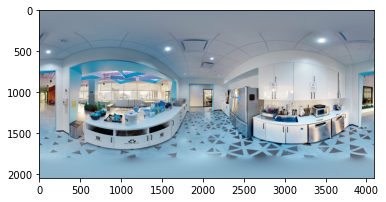

In [20]:
import matplotlib.pyplot as plt
plt.imshow(output_frame)